<b><div style="text-align:right">Алексей Бебчик&nbsp;&nbsp;</div><b>
### Курс 6. Желтое такси. Неделя 4. Прогнозирование ряда со сложной сезонностью  
(задание, оцениваемое сокурсниками)




### Часть 1. Кластеризация

<a href="https://www.coursera.org/learn/data-analysis-project/peer/zp6d0/proghnozirovaniie-bol-shogho-kolichiestva-riadov">Задание</a>


Процесс подбора модели ARIMA в Питоне достаточно трудоёмок, поэтому вы не сможете вручную подобрать модель для каждого из рядов в выбранных ячейках. Чтобы облегчить ручной перебор, вам предстоит кластеризовать временные ряды и подобрать гиперпараметры модели ARIMA только один раз для всех рядов каждого кластера. 

Результатом этой недели будут построенные с помощью ARIMA почасовые прогнозы количества поездок для всех географических зон Нью-Йорка. Модель, которую мы строим, должна делать почасовые прогнозы для всех выбранных непустых ячеек на 6 часов вперёд. Качество модели мы будем оценивать с помощью среднего абсолютного отклонения от истинного количества поездок в июне:  

$Q_{june} = \frac1{R* 715 * 6} \sum\limits_{r=1}^{R}  \sum_{T=2016.05.31\,23:00}^{2016.06.30\,17:00}  \sum_{i=1}^6 \left| \hat{y}_{T|T+i}^r - y_{T+i}^r \right|.$

$R$ — количество прогнозируемых рядов, 715 — количество перебираемых концов истории.

Построенные прогнозы вам предстоит загрузить на kaggle. К сожалению, в формате kaggle сложно организовать конкурс по прогнозированию временных рядов в традиционном виде, с отложенным тестом и пересчётом лидерборда, поскольку прогнозы необходимо строить со скользящим концом истории. Но цель использования kaggle в этом проекте — не победа в конкурсе; вы всегда можете загрузить истинные данные за июнь и получить первое место. Цель в том, чтобы посмотреть, какие модели, решения и признаки использовали ваши коллеги, и понять, какие из них стоит попробовать и вам.

Чтобы сдать задание, выполните следующую последовательность действий.  

1.Составьте из данных о поездках прямоугольную таблицу так, чтобы по строкам было время, а по столбцам идентификатор ячейки (возьмите только те, которые были отобраны на второй неделе). __Не используйте данные за последние имеющиеся месяцы — май и июнь 2016!__  

2.Перед проведением кластеризации стандартизуйте столбцы (вычтите выборочное среднее и поделите на выборочную дисперсию). Это необходимо, поскольку при выборе модели ARIMA имеет значение только форма ряда, но не его средний уровень и размах колебаний.  

3.Кластеризуйте географические зоны по значениям стандартизованных рядов. Подберите число кластеров так, чтобы оно было не слишком большим, но ряды внутри кластеров имели похожую форму. Постройте графики стандартизованных рядов каждого кластера, чтобы в этом убедиться.  

4.В каждом кластере выберите наиболее типичный ряд (например, это может быть ряд, соответствующий центру кластера).

__Внимание!__ Пользовалтельские функции определены в конце файла. Пожалуйста, пройдите вниз файла, выполните __"Блок определения пользовательских функций"__, затем вернитесь продолжите с этого места.

In [15]:
#%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import binned_statistic_2d
import scipy.cluster.hierarchy as hac         #иерархическая дендрограмма
import sys                                    #для изменения числа допустимых рекурсий
import os                                     #для проверки существования файлов
import itertools
import statsmodels.api as sm
from sklearn import preprocessing
from sklearn import linear_model
from sklearn import metrics
from sklearn.cluster import KMeans
import datetime as dt
from tslearn.clustering    import TimeSeriesKMeans #библиотека для работы с временными рядами tslean 
from tslearn.datasets      import CachedDatasets 
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, TimeSeriesResampler
from tslearn.utils         import to_time_series_dataset
import seaborn as sns 
from   mpl_toolkits.basemap import Basemap
import geojson
import folium
import timeit as ti
from  statsmodels.tsa.arima_model import ARIMAResults
%pylab inline

Populating the interactive namespace from numpy and matplotlib


Имортированная библиотека __TSLEARN__  создана специально для анализа временных рядов
http://tslearn.readthedocs.io/en/latest/auto_examples/plot_kmeans.html  
http://tslearn.readthedocs.io/en/latest/gen_modules/clustering/tslearn.clustering.TimeSeriesKMeans.html#class-dbakmeans  
Установка (cmd в режиме администратора, pip install не сработал): conda install -c conda-forge tslearn

__ Загрузим уже агрерированные данные за 2016 год (файл с таким именем прилагается к работе)__

In [22]:
data_path = '..\\YTData\\' #путь к папке с данными

In [23]:
def print_time(label='now'):
    print label, dt.datetime.now().strftime('%H:%M')

In [24]:
#Имя файла с данными для формирования и загрузки
w4_file = data_path + 'YTw4_tripdata_2016' #K6_w4_tripdata_2016 YTw3_EmpireSateBuilding_2016_jan-may' 

In [25]:
#Справочные данные по Нью-Йорку и его районам
west_ny, east_ny, south_ny, north_ny  = -74.25559,-73.700018, 40.49612, 40.91553 #координаты квадрата Нью_Йорка
cx_ny, cy_ny = (west_ny+east_ny)/2.0, (south_ny+north_ny)/2.0                    #координаты центра квадрата Нью-Йорка
dfreg = pd.read_csv(data_path+'regions.csv', sep=';')    #список и координаты районов
dfreg['row'] = dfreg.region     // 50          #строка района в матрице 50x50
dfreg['col'] = (dfreg.region-1)  % 50          #столбец района в матрице 50x50
x_edges_ny = sorted(set(dfreg.west.unique())  | set(dfreg.east.unique()) ) #сетка районов по х lon
y_edges_ny = sorted(set(dfreg.south.unique()) | set(dfreg.north.unique())) #сетка районов по y lat

In [26]:
cload = False #True
if cload==True: 
    data_all = pd.read_csv(w4_file, parse_dates=['dt_hour'], dayfirst=True) #Загружаем подготовленные данные из файла
else:
    data_all = load_prepare_save_data(save_file_name=w4_file, month_count=6) #Готовим данные с сохраняем в файл

read ..\YTData\yellow_tripdata_2016-01.csv 11:14


C:\Users\AUser\Anaconda2\lib\site-packages\scipy\stats\_binned_statistic.py:599: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  result = result[core]


read ..\YTData\yellow_tripdata_2016-02.csv 11:15
read ..\YTData\yellow_tripdata_2016-03.csv 11:16
read ..\YTData\yellow_tripdata_2016-04.csv 11:17
read ..\YTData\yellow_tripdata_2016-05.csv 11:18
read ..\YTData\yellow_tripdata_2016-06.csv 11:20


In [34]:
#Координаты квадрата Нью_Йорка
west_ny, east_ny, south_ny, north_ny  = -74.25559,-73.700018, 40.49612, 40.91553

#Загружаем районы и получаем границы корзин
regs = pd.read_csv(data_path + 'regions.csv', sep=';') 
binx  = sorted(set(regs.west.value_counts().index)  | set(regs.east.value_counts().index ))
biny  = sorted(set(regs.south.value_counts().index) | set(regs.north.value_counts().index))

In [35]:
#Функция разбиения данных на квадраты
def get_regs(prm_df, prm_lon, prm_lat):
        r_bins = binned_statistic_2d(x = prm_df[prm_lon], y = prm_df[prm_lat], values = None, statistic = 'count', 
            bins  = [binx, biny],
            range = [[west_ny, east_ny], [south_ny, north_ny]], 
            expand_binnumbers = True)
        bin_regs = np.array([(x-1) * 50 + y for x, y in zip(*r_bins.binnumber)]) #Вычислим номер региона
        return bin_regs

In [49]:
%%time 
month_count = 6

data_cols = ['tpep_pickup_datetime', 'tpep_dropoff_datetime',
             'passenger_count', 'trip_distance','pickup_longitude','pickup_latitude', 'dropoff_longitude', 'dropoff_latitude'] 

cols_groupby  = ['dt_hour','region']

# Составим список файлов для обработки
files = [data_path + 'yellow_tripdata_2016-' + ('0'+str(x+1))[-2:] + '.csv' for x in range(month_count)] [:] #для отладкаи 5

dfmon_list   = []
dfm_sum_list = []
for i, f in enumerate(files): #tqdm_notebook(

    print_time('read '+ f)
    
    for dfm in pd.read_csv(f, sep=',', parse_dates=['tpep_pickup_datetime','tpep_dropoff_datetime'], usecols=data_cols, 
                        chunksize = 10000000):

        print_time('start chunck')
        del_index = dfm[(dfm.tpep_pickup_datetime == dfm.tpep_dropoff_datetime) #Нулевая длительность
                    | (dfm['passenger_count' ] == 0)          # поездки с нулевым количеством пассажиров
                    | (dfm['trip_distance'   ] == 0)          # поездки с нулевым расстоянием поездки по счётчику
                    | (dfm['pickup_longitude'] <  west_ny)    # поездки, не попадающие в прямоугольник Нью-Йорка
                    | (dfm['pickup_longitude'] >= east_ny)    
                    | (dfm['pickup_latitude' ] <  south_ny)   
                    | (dfm['pickup_latitude' ] >= north_ny)  
                         ].index
        dfm.drop(del_index, inplace=True) #удаляем записи, не входящие в квадрат Нью-Йорка

#         print_time('binned_statistic_2d ')
        #Разобъем данные на квадраты (откуда едем)
        dfm['region']  = get_regs(dfm, 'pickup_longitude', 'pickup_latitude')

        #Разобъем данные на квадраты (район окончания поездки) 
#         print_time('binned_statistic_2d drop')
        dfm['dt_hour']  = dfm.tpep_pickup_datetime.dt.floor('H') 

        #Время поездки считается достаточно долго (похоже из-за seconds/60)
        #При простом вычитании столбцов на Windows7 возникает ошибка: TypeError: data type "datetime" not understood
        #В качестве решения в интернете предлагается использовать values, создающий np.array         
#         dfm.loc[:, 'trip_len'] = dfm.tpep_dropoff_datetime.values - dfm.tpep_pickup_datetime.values
#         dfm.loc[:, 'trip_len'] = np.array(dfm.trip_len.dt.seconds/60, int)
        
        dfm_sum = dfm.groupby(cols_groupby, as_index=False).sum()
        
#!!!         dfm_sum.drop(cols_file_gps+['region_in'], axis=1, inplace=True)
        
        dfm_sum.loc[:,'trips'] = np.array(dfm.groupby(cols_groupby, 
                                                      as_index=False).passenger_count.count()[['passenger_count']], int)

        
# !!!        dfm_in = dfm.groupby(['dt_hour', 'region_in']+cols_cat, as_index=False).passenger_count.count()
# !!!        dfm_in.rename(columns={'region_in':'region', 'passenger_count':'in_count'}, inplace=True)
# !!!        dfm_sum['trips_in'] = dfm_sum.merge(dfm_in, how='left', 
# !!                                              on = cols_groupby).fillna(0).in_count.astype(int)
        
        dfm_sum_list.append(dfm_sum)

read ..\YTData\yellow_tripdata_2016-01.csv 15:23
start chunck 15:24
start chunck 15:25
read ..\YTData\yellow_tripdata_2016-02.csv 15:25
start chunck 15:26
start chunck 15:26
read ..\YTData\yellow_tripdata_2016-03.csv 15:26
start chunck 15:27
start chunck 15:27
read ..\YTData\yellow_tripdata_2016-04.csv 15:27
start chunck 15:28
start chunck 15:28
read ..\YTData\yellow_tripdata_2016-05.csv 15:29
start chunck 15:29
start chunck 15:30
read ..\YTData\yellow_tripdata_2016-06.csv 15:30
start chunck 15:30
start chunck 15:31
Wall time: 7min 31s


In [50]:
%%time
dfm_sum_all = pd.concat(dfm_sum_list)

Wall time: 101 ms


In [51]:
#Подсчитываем среднее число поездок в час (по данным за май 2016, согласно 2-му заданию)
data_mean = data_all[(data_all.dt_hour.dt.year==2016)&
                     (data_all.dt_hour.dt.month==5)].groupby('region', as_index=False)['trips'].mean()
regs_less5 = data_mean[data_mean.trips<5].region.values  #районы, в которых среднее число поездок меньше 5, их надо удалить
data_all.drop(data_all[data_all.isin({'region':regs_less5}).region ].index, inplace=True) #удаляем данные этих районов

In [52]:
print data_all.region.unique().shape[0] #Осталось 102 районов (если брать не только за май, получится иное чсило районов)

102


In [53]:
data_all['fold'] = 0 #определим фолды для обучения ("1-до мая" и "2-с мая до июня")
data_all.loc[data_all.dt_hour < dt.datetime(2016,6,1), 'fold'] = 2 #Фолд 2 (предсказание)
data_all.loc[data_all.dt_hour < dt.datetime(2016,5,1), 'fold'] = 1 #Фолд 1 (предсказание + настройка параметров модели)
print 'Размер Фолда 1', data_all[(data_all.fold <> 0) & (data_all.fold <= 1)].shape[0]
print 'Размер Фолда 2', data_all[(data_all.fold <> 0) & (data_all.fold <= 2)].shape[0]

Размер Фолда 1 296208
Размер Фолда 2 372096


In [54]:
data_all.set_index('dt_hour', drop=False, inplace=True) #восстанавливаем индекс на основе Даты-времени
data_all.index.name = 'dt_index' 
data_all.head(1)

,dt_hour,region,trips,fold
dt_index,,,,
2016-01-01,2016-01-01,1075,80,1


<center>__Кластеризация__</center>

__1.__ Составьте из данных о поездках прямоугольную таблицу так, чтобы по строкам было время, а по столбцам идентификатор ячейки (возьмите только те, которые были отобраны на второй неделе). __ Не используйте данные за последние имеющиеся месяцы — май и июнь 2016! __ 

In [55]:
#часть для обучения (можно назвать train, но так удобнее, тест будет только в конце)
data_F1 = data_all[data_all.fold==1].copy() 

In [56]:
print 'Всего {}, для обучения {}'.format(data_all.shape[0], data_all[data_all.fold==1].shape[0])


Всего 445536, для обучения 296208


In [57]:
# Составьте из данных о поездках прямоугольную таблицу так, чтобы по строкам было время, а по столбцам идентификатор ячейки
data_pvt = pd.pivot_table(data_F1, values='trips', index =['dt_hour'], columns=['region'])

In [58]:
data_pvt.head(2)

region,1075,1076,1077,1125,1126,1127,1128,1129,1130,1131,...,1630,1684,1733,1734,1783,2068,2069,2118,2119,2168
dt_hour,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00,80,144,50,77,319,402,531,617,846,267,...,12,0,2,44,5,41,4,70,7,66
2016-01-01 01:00:00,91,211,49,134,404,420,370,453,594,224,...,29,0,5,2,2,4,0,47,1,29


In [59]:
print 'Максимальная дата обучающей выборки:', data_pvt.index.max()

Максимальная дата обучающей выборки: 2016-04-30 23:00:00


__2.__ Перед проведением кластеризации стандартизуйте столбцы (вычтите выборочное среднее и поделите на выборочную дисперсию). Это необходимо, поскольку при выборе модели ARIMA имеет значение только форма ряда, но не его средний уровень и размах колебаний.

In [60]:
data_clust = pd.DataFrame(preprocessing.scale(data_pvt), columns=data_pvt.columns, index=data_pvt.index)

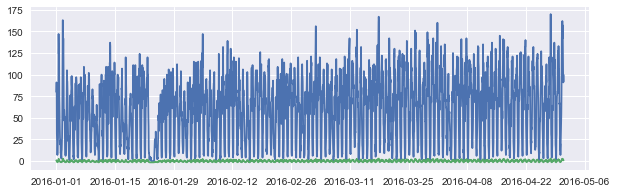

In [61]:
plt.figure(figsize(10,3)) #Убедимся, что масштаблирование сработало
plt.plot(data_pvt[data_clust.columns[0]])
plt.plot(data_clust[data_clust.columns[0]])

__3__ .Кластеризуйте географические зоны по значениям стандартизованных рядов. Подберите число кластеров так, чтобы оно было не слишком большим, но ряды внутри кластеров имели похожую форму. Постройте графики стандартизованных рядов каждого кластера, чтобы в этом убедиться.

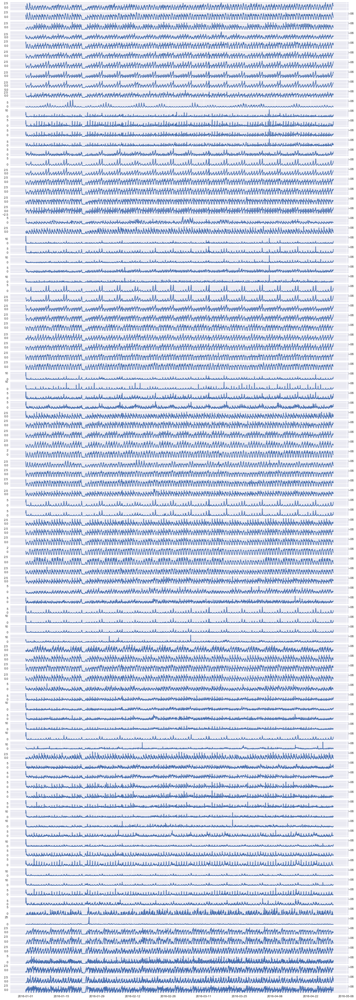

In [62]:
plt.figure(figsize(20,60)) #график всех рядов
for i, col in enumerate(data_clust.columns): 
    plt.subplot(102, 1, i+1)
    plt.plot(data_clust[data_clust.columns[i]]) 

Визуально можно разлечить ряды с различной фактурой, видимо, __можно выделить кластеры__

__Создадим структуру для кластеризации районов различными методами__

In [63]:
clust_clr = ['#2200CC' ,'#D9007E' ,'#FF6600' ,'#FFCC00' ,'#ACE600' ,
             '#0099CC' , '#8900CC' ,'#FF0000' ,'#FF9900' ,'#FFFF00' ,'#00CC01' ,'#0055CC']
clust_reg   = data_clust.columns
clust_knd   = {} #методы кластеризации
clust_lbl   = {} #метки кластеров
clust_ctr   = {} #центры кластеров
clust_dst   = {} #суммарное расстояние до центра кластеров
clust_near  = {} #ближайший к центру кластера район
clust_count = 0
# np.set_printoptions(threshold=np.nan)

__Кластеризация с помощью KMeans (на основе данных ряда)__

In [64]:
km_data = KMeans(n_clusters=5, random_state=0).fit(data_clust.T)

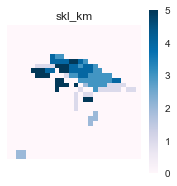

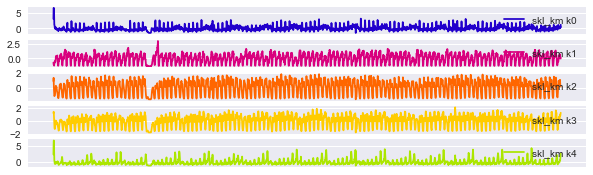

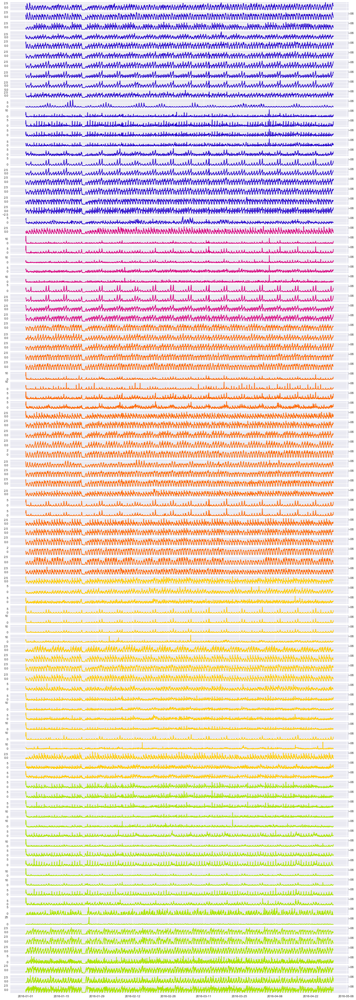

In [65]:
#сохранение и визуализация данных клстеризации
save_clust_data('skl_km', km_data)
draw_clust_map('skl_km')    #карта калстеров 
draw_clust_ctr('skl_km')    #ряды центры кластеров
draw_clust_series('skl_km') #все ряды с указанием калстера

В принипе, географически клсатеры ряды собраны в кластеры достаточно неплохо, много связных областаей

__Кластеризация с помощью KMeans (на основе метрик)__

Попробуем посчитать также некоторые __метрики__ на рядах и кластеризовать данные уже на них

In [66]:
#Стандартное описание данных
data_clust_props = data_clust.describe().T[['mean','std']]
data_clust_props['var']     = data_clust_props['std'] / data_clust_props['mean'] #Коэффициент вариации
data_clust_props['std2']    = 2*data_clust_props['std'] #2 сигма 
data_clust_props['std3']    = 3*data_clust_props['std'] #3 сигма 
data_peaks2, data_peaks3, data_peaks99, data_peaks97 = [], [], [], []
for c in data_clust.columns: 
    data_peaks2.append(data_clust[np.abs(data_clust[c] - data_clust_props.T[c]['mean']) #Число пиков по больше 2 сигма
                                  >= data_clust_props.T[c]['std2']].shape[0])
    data_peaks3.append(data_clust[np.abs(data_clust[c] - data_clust_props.T[c]['mean']) #Число пиков по больше 3 сигма
                                  >= data_clust_props.T[c]['std3']].shape[0])
    data_peaks99.append(data_clust[data_clust[c].abs() > abs(data_clust[c].quantile(0.99))].shape[0]) #число пиков > 99%
    data_peaks97.append(data_clust[data_clust[c].abs() > abs(data_clust[c].quantile(0.97))].shape[0]) #число пиков > 97%
data_clust_props['peaks2']  = np.array(data_peaks2)
data_clust_props['peaks3']  = np.array(data_peaks3)
data_clust_props['peaks99'] = np.array(data_peaks99)
data_clust_props['peaks97'] = np.array(data_peaks97)
#data_clust_props['meadian'] = data_clust.median()   #Медианный элемент не вносил каких-либо улучшений

#Обучаемся на признаках описания кластеров
km_prop_cols = data_clust_props.columns
km_prop_cols = ['peaks2','peaks3', 'peaks97','peaks99'] #адекватный вариант
km_prop = KMeans(n_clusters=5, random_state=0).fit(data_clust_props[km_prop_cols])

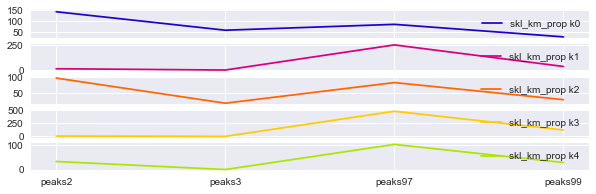

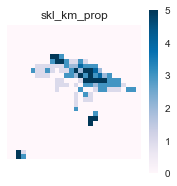

In [67]:
#сохраняем и визуализация данных клстеризации
save_clust_data('skl_km_prop', km_prop, set_near=False) 
draw_clust_ctr('skl_km_prop', clust_x=km_prop_cols)
draw_clust_map('skl_km_prop')

Получилось достаточно сомнительно. На кластеризацию очень сильно влияет коэффициент вариации, но кластерс при этом получаются географически крайне разрозненными. В целом смежности кластеров добиться не удается.

Возможно, следует __устранить выскоки__ для целей кластеризации

<center>__KMeans__ из __TSLEARN__</center>

In [68]:
# Необходима предобработка данных, т.к. tslearn работает с данными в своем формате
ts_data = to_time_series_dataset(np.array(data_clust.T))
ts_data_s1 = to_time_series_dataset(np.array(data_clust[-1000:].T)) #уменшенный размер ряда для обучения sDTW
ts_data_s2 = to_time_series_dataset(np.array(data_clust[-500:].T))  #уменшенный размер ряда для обучения sDTW

__TSLEARN. Евклидова метрика__ (работает быстро)

In [69]:
%%time
seed = 0
km_eucl = TimeSeriesKMeans(n_clusters=5, verbose=True, random_state=seed,metric='euclidean')
km_eucl.fit(ts_data)

1528.238 --> 963.905 --> 946.058 --> 944.524 --> 944.524 --> 
Wall time: 129 ms


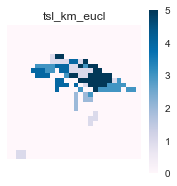

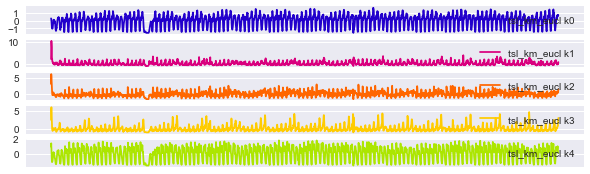

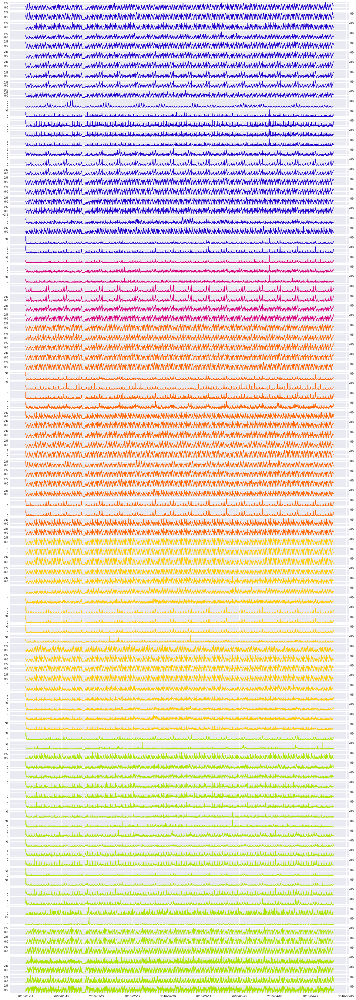

In [70]:
#сохранение и визуализация данных клстеризации
save_clust_data('tsl_km_eucl', km_eucl) 
draw_clust_map('tsl_km_eucl')
draw_clust_ctr('tsl_km_eucl')
draw_clust_series('tsl_km_eucl') 

Кластеры вглядят географически доводьно близкими, но в центре есть фрагментация.

__TSLEARN. Метрика DTW__ (работает очень медленно, будем использовать __softdtw__ и сокращенный набор данных)

In [71]:
%%time
seed = 0
km_sdtw_s2 = TimeSeriesKMeans(n_clusters=5, verbose=True, random_state=seed,metric="softdtw", metric_params={"gamma_sdtw": .01})
km_sdtw_s2.fit(ts_data_s2) #для более быстрого обучения возьмем часть данных, иначе можно ждать часами  
#500: 8min, 1000: 34min

10482.366 --> 4922.030 --> 4838.951 --> 4696.966 --> 4688.215 --> 4688.215 --> 
Wall time: 8min 8s


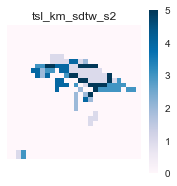

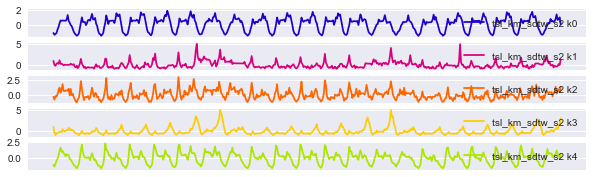

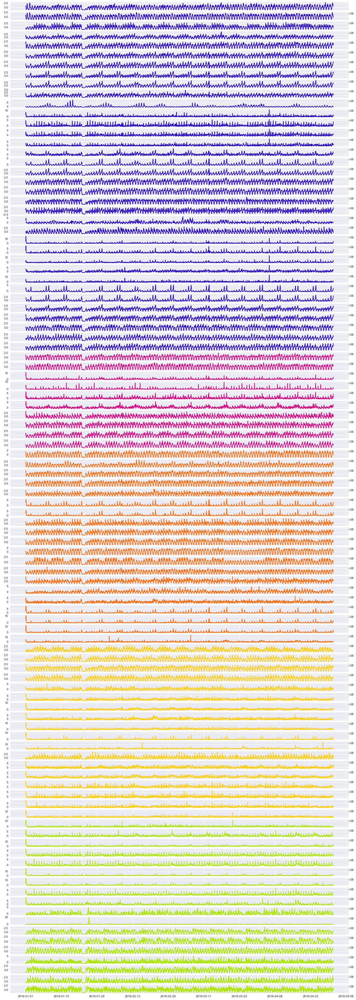

In [72]:
#сохранение и визуализация данных клстеризации
save_clust_data('tsl_km_sdtw_s2', km_sdtw_s2, set_near=False) #(False-используем не все строки)
draw_clust_map('tsl_km_sdtw_s2')
draw_clust_ctr('tsl_km_sdtw_s2')
draw_clust_series('tsl_km_sdtw_s2')

Кластеры вглядят географически более близкими, это, в общем-то, хорошо.

In [58]:
%%time 
km_sdtw_s1 = TimeSeriesKMeans(n_clusters=5, verbose=False, random_state=seed,metric="softdtw", metric_params={"gamma_sdtw": .01})
km_sdtw_s1.fit(ts_data_s1) #для более быстрого обучения возьмем часть данных, иначе можно ждать часами  
# 42min (24min 53s, если :1000)

Wall time: 42min 3s


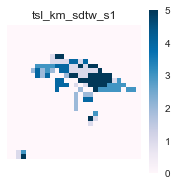

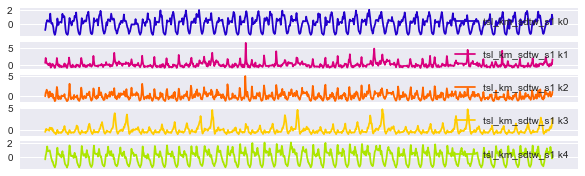

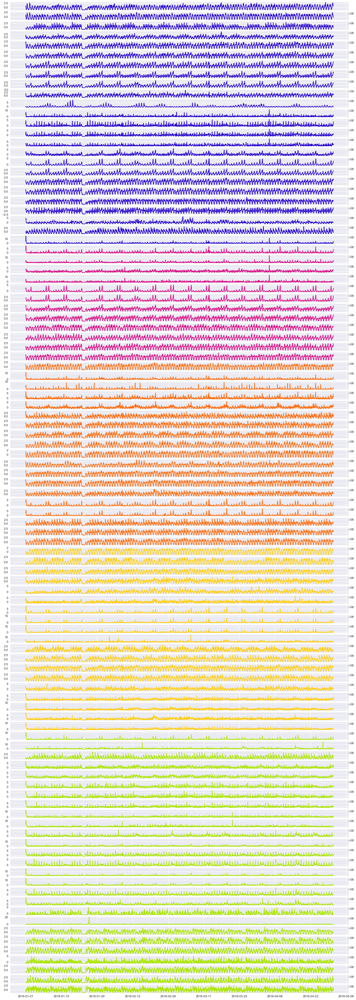

In [59]:
#сохранение и визуализация данных клстеризации
save_clust_data('tsl_km_sdtw_s1', km_sdtw_s1, set_near=False)  #(False-используем не все строки)
draw_clust_map('tsl_km_sdtw_s1')
draw_clust_ctr('tsl_km_sdtw_s1')
draw_clust_series('tsl_km_sdtw_s1')

Результат обучения на 1000 записей очень похож на обучение на 500 записей, только получался значитльно дольше.

__Кластеризация. Выводы__  

В целом на карте кластеризация с помощью __DTW__ выглядит __вполне нормально__.

Далее стоит посчитать __метрики качества__ на опробованных методах, чтобы формально оценить качество кластеризации.

После этого можно приступать к __прогнозированию__.

<center>__ Метрики качества __</center>

Самая простая метрика качества выдается самим методами кластеризации в переменной __ inertia__, это суммарное расстояние до центра кластера. 

In [73]:
print sorted(clust_dst.items(), key=lambda x: x[1])

[('tsl_km_eucl', 945), ('tsl_km_sdtw_s2', 4688), ('skl_km', 96065), ('skl_km_prop', 111347)]


Согласно этой метрике, побеждает __TSLEARN__ K-means с метририкой __Euclidean__, хотя визуально он же с метрикой sDTW мне нравится больше.

Попробуем перебирать __число кластеров__ для победителя Euclidean и будем анализировать состояние метрики

In [74]:
%%time
tsl_km_eucl_ceil = 20
tsl_km_eucl_dst = []
for i in range(tsl_km_eucl_ceil):
    seed = 0
    tsl_km_eucl = TimeSeriesKMeans(n_clusters=i+1, verbose=False, random_state=seed, metric='euclidean')
    tsl_km_eucl.fit(ts_data)
    tsl_km_eucl_dst.append(int(round(tsl_km_eucl.inertia_,0)))

Wall time: 2.29 s


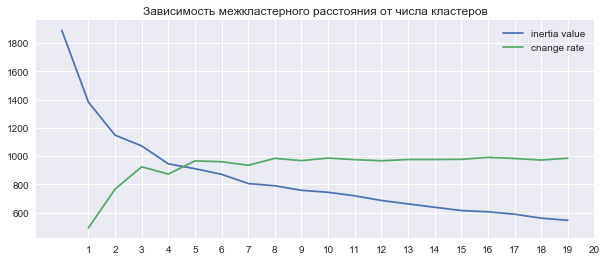

In [75]:
plt.figure(figsize(10,4))
plt.plot(range(tsl_km_eucl_ceil), tsl_km_eucl_dst, label = 'inertia value')
plt.plot(np.array(range(tsl_km_eucl_ceil-1))+1, np.diff(np.array(tsl_km_eucl_dst))+1000, label = 'cnange rate')
plt.xticks(np.array(range(tsl_km_eucl_ceil))+1)
plt.title(u'Зависимость межкластерного расстояния от числа кластеров')
plt.legend()
plt.show()

Очевидно, с увеличеснием числа кластеров межкластерное расстояние убывает, но если мы посмотрим на скорость убывания, то начиная с на __3-х__ кластерах происходит явное снижение скорости убывания, потом на __4-х__ небольшой рост, а начианя начиная с __5-и__ кластеров скорость уменьшения межкластерного расстояние практически не меняется.   

Таким образом, выбранное изначально значение в __5__ кластеров можно считать __оптимальным__.   

Однако __4__ тоже можно рассмотреть подробнее, ступенька на нем является странной, рассмтрим варианты 3 и 4 кластера.

Wall time: 508 ms


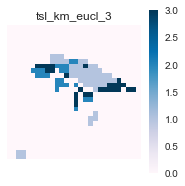

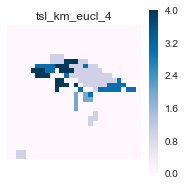

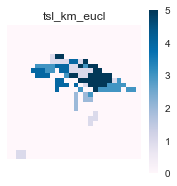

In [76]:
%%time
seed = 0
km_eucl_3 = TimeSeriesKMeans(n_clusters=3, verbose=False, random_state=seed,metric='euclidean')
km_eucl_3.fit(ts_data)
km_eucl_4 = TimeSeriesKMeans(n_clusters=4, verbose=False, random_state=seed,metric='euclidean')
km_eucl_4.fit(ts_data)
save_clust_data('tsl_km_eucl_3', km_eucl_3) #сохраняем данные клстеризации
save_clust_data('tsl_km_eucl_4', km_eucl_4) #сохраняем данные клстеризации
draw_clust_map('tsl_km_eucl_3')
draw_clust_map('tsl_km_eucl_4')
draw_clust_map('tsl_km_eucl'  )

На картах видно, что __4__ кластера, в общем-то, вглядит неплохо, но все же ступенька есть, и __лучше взять 5__.

In [77]:
clust_count = 5
clust_list = range(1,clust_count+1)

<center>__Выбор рядов для прогнозирования__</center>

Для прогнозирования нам нужно из каждого кластера выбрать по одному ряду. Чтобы это сделать, предлагается в рамках каждого кластера посчитать корреляцию между каждым рядом кластера и рядом, образующим центр кластера. Ряд, корреляция которого с центром кластера будет максимальной, т.е. наиболее похожий на центр кластера, будет выбран нами в качестве представителя кластера, его мы и будем прогнозировать.

In [78]:
 clust_near['tsl_km_eucl'] #корреляция с центром кластера рассчитывается и заполняется при сохранении данных кластеризации

[(0, 2168), (1, 1630), (2, 1483), (3, 1426), (4, 1434)]

Посмотрим на визуально на центры кластеров и наиболее близкие к неим ряды, которые мы выбрали для настройки моделей

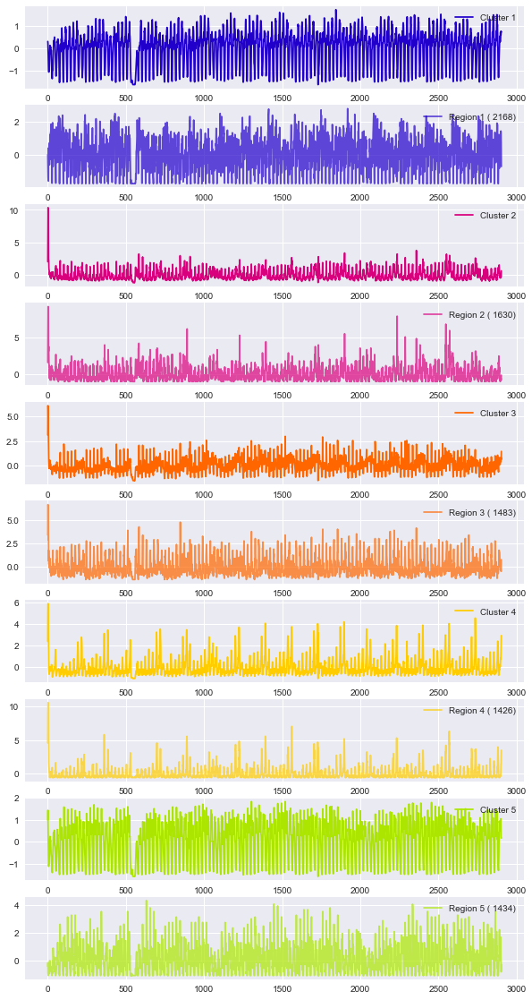

In [79]:
draw_clust_ctr_near('tsl_km_eucl')

Для кластеризации можно попробовать __методы понижения размерности__, но пока этого не делаем

In [80]:
# pca = PCA(n_components=2).fot_transform(data)

<center>__Настройка моделей для прогнозирования__</center>

In [81]:
clust_kind = 'tsl_km_eucl'
print clust_near[clust_kind]

[(0, 2168), (1, 1630), (2, 1483), (3, 1426), (4, 1434)]


In [82]:
#сформируем номер кластера для каждой поездки в агрегированных данных и запишем данные кластеризации в файл
reg_clust_all = pd.DataFrame(zip(np.array(data_clust.columns), clust_lbl[clust_kind]), columns=['region','label'])
reg_clust_all['label'] = reg_clust_all['label'] + 1 #кластеры нумеруются с 1

In [83]:
#сформируем номер кластера для районов-представителей кластеров, выбранных для настроки модели
reg_clust_one = pd.DataFrame(clust_near[clust_kind], columns=['label', 'region'])
reg_clust_one['label'] = reg_clust_one['label'] + 1 #кластеры нумеруются с 1 (0 для районов не представителей)
reg_clust_all['one']   = reg_clust_all.merge(reg_clust_one, #проставим признак главного региона в кластере
                                             how='left', on=['region']).label_y.fillna(0).apply(lambda x: 1 if x>0 else x)

In [84]:
reg_clust_all.to_csv(w4_file+'_reg_clust.csv', index=False) #сохраним кластеры в файле

После расчета всех кластеров и сохранения в файл переходим
на файл __Part2_FitPrms__

__Блок определения пользовательских функций__

In [21]:
#функция сохранения данных о полученных кластерах разнымми видами кластеризации 
def save_clust_data(clust_kind, clust_obj, set_near=True):  #clust_kind - вид кластеризации, clust_obj - кластеризующий объект 
    clust_knd[clust_kind] = 1                           #вид классификации 
    clust_lbl[clust_kind] = clust_obj.labels_           #метки кластеров 
    clust_ctr[clust_kind] = clust_obj.cluster_centers_  #центры кластеров 
    clust_dst[clust_kind] = int(round(clust_obj.inertia_,0)) #суммарное расстояние до центра кластеров 
    if set_near == True:
        clust_near[clust_kind] = get_clust_near(clust_kind)
    else:
        clust_near[clust_kind] = None

def print_clusters(data_cluster, Z, k, plot = False, criterion='maxclust', depth=0):
    results = fcluster(Z, k, criterion=criterion, depth=depth)
    s = pd.Series(results)
    clusters = s.unique()
    
    for c in clusters:
        cluster_indices = s[s==c].index
        print 'Cluser %d number of entries %d' % (c, len(cluster_indices))
        if plot:
            data_cluster.T.iloc[:, cluster_indices].plot()

#функция находит районы, наиболее близкие к центрам своих кластеров. Возвращает список пар (кластер,район)
def get_clust_near(clust_kind):
    t_clust_near = []
    for i in range(clust_ctr[clust_kind].shape[0]):
        t_ctr = clust_ctr[clust_kind][i].ravel()
        t_clust_reg = 0
        for c in clust_reg[clust_lbl[clust_kind] == i]: #перебираем кластеры
            t_clust_corr = 0.0
            t_col = data_clust.columns[data_clust.columns == c]
            t_reg_data = np.array(data_clust[t_col]).ravel()
            t_reg_corr = round(np.corrcoef([t_ctr, t_reg_data])[0][1],2)
            if t_reg_corr > t_clust_corr:
                t_clust_reg = t_col
        t_clust_near.append((i, c))
    return t_clust_near

#clust_lbl содержит не все районы, а для карты нужна матрица со всеми районами с указанием кластера
def get_clust_map(clust_kind, shrinked=True): #clust_kind - вид кластеризации
    tmp_clust = pd.DataFrame()
    tmp_clust['region'] = clust_reg
    tmp_clust['label']  = clust_lbl[clust_kind]+1 #кластеры нумеруются с нуля, но для нас здесь 0 - район без данных 
    tmp_map = np.array(dfreg.merge(tmp_clust, how ='left', on = ['region']).fillna(0)['label'], int).reshape(50,50) 
    if shrinked == True: 
        tmp_map = tmp_map[15:-7,15:-7]
    return tmp_map

# рисует раскрашенные кластерами ряды (в порядке следования кластеров)
def draw_clust_series(clust_kind): #clust_kind - вид кластеризации
    plt.figure(figsize(20,60))
    t_clust_sorted = sorted(zip(clust_reg, clust_lbl[clust_kind]), key=lambda x: x[1])
    t_clust_col    = np.array(t_clust_sorted)[:,0]
    t_clust_lbl    = np.array(t_clust_sorted)[:,1]
    for i, col in enumerate(t_clust_col):
        t_lbl = t_clust_lbl[i]
        plt.subplot(102, 1, i+1)
        plt.plot(data_clust[data_clust.columns[i]], c = clust_clr[t_lbl]) 
    plt.show()

# рисует ряды центров кластеров
def draw_clust_ctr(clust_kind, clust_x=[]): #clust_kind - вид кластеризации
    plt.figure(figsize(10,6))
    for i in range(clust_ctr[clust_kind].shape[0]):
        plt.subplot(10, 1, i+1)
        plt.plot(clust_ctr[clust_kind][i].ravel(), c=clust_clr[i], label = clust_kind + ' k' + str(i))
        if clust_x <> '':
            plt.xticks(range(0,len(clust_x)),clust_x)
        
        plt.legend(loc='upper right')
    plt.show()

def draw_clust_ctr_near(clust_kind): #clust_kind - вид кластеризации
    plt.figure(figsize(10,20))
    t_k = 0
    for i, clust_reg in clust_near[clust_kind]:
        t_ctr = clust_ctr[clust_kind][i].ravel()
        t_col = data_clust.columns[data_clust.columns == clust_reg]
        t_reg = np.array(data_clust[t_col]).ravel()
        t_k = t_k+1
        plt.subplot(len(clust_near[clust_kind])*2, 1, t_k)    
        plt.plot(t_ctr, c = clust_clr[i], label = 'Cluster ' + str(i+1))
        plt.legend(loc='upper right')
        t_k = t_k+1
        plt.subplot(len(clust_near[clust_kind])*2, 1, t_k)    
        plt.plot(t_reg, c = clust_clr[i], alpha = 0.7, label = 'Region ' + str(i+1) + ' ( ' + str(clust_reg)+')')  
        plt.legend(loc='upper right')
    plt.show()

# рисует карту расположения кластеров
def draw_clust_map(clust_kind): #clust_kind - вид кластеризации
    plt.figure(figsize(3,3))
    ax = sns.heatmap(get_clust_map(clust_kind), square=True, cmap='PuBu', xticklabels=False, yticklabels=False)
    plt.title(clust_kind)

# рисует карту расположения кластеров на Basemap
def draw_clust_basemap(clust_kind): #clust_kind - вид кластеризации
    plt.figure(figsize=(6, 6))
    m = Basemap(llcrnrlon=west_ny, llcrnrlat=south_ny, urcrnrlon=east_ny, urcrnrlat=north_ny, lat_0=cx_ny, lon_0=cy_ny, 
                resolution = 'h', projection = 'moll', epsg = 4269)
    # m.arcgisimage(service='World_Street_Map', xpixels=1200) #без интернета не работает
    x,y = m(x_edges_ny,y_edges_ny)
    my_cmap = plt.get_cmap('spectral') #устанавливаем палитру
    my_cmap.set_under('white')
    cs = m.pcolormesh(x,y,get_clust_map(clust_kind), cmap=my_cmap, alpha=0.4) #рисуем кластеры на карте
    plt.show()

# рисует карту расположения кластеров на Folium map
def draw_clust_foluimmap(clust_kind): #clust_kind - вид кластеризации
    folium_data = pd.DataFrame()
    folium_data['region'] = data_clust.columns
    folium_data['cnt']    = map(lambda x: (x+1)*1000, clust_lbl[clust_kind])
    regs_with_data = data.region.unique() #регионы с поездками (для оптимищации)
    reg_features   = []
    for i, row in dfreg.iterrows(): #райноны в формете GeoJSON
        #порядок имеет значение, нельзя просто сотсавлять любые пары
        reg_coord   = [(row.west, row.south), (row.west, row.north), (row.east, row.north), (row.east, row.south)]
        reg_poligon = geojson.Polygon([reg_coord])
        reg_feature = geojson.Feature(geometry=reg_poligon, id=row.region,
                                      properties={"name":row.region, "description":'reg'+str(row.region)})
        reg_features.append(reg_feature) 
    reg_feature_col = geojson.FeatureCollection(reg_features) 
    m = folium.Map(location=[cy_ny, cx_ny], zoom_start=10, tiles='Stamen Toner')
    m.choropleth(
        geo_data     = reg_feature_col,
        name         = 'choropleth',
        data         = folium_data,
        columns      = ['region', 'cnt'],
        key_on       = 'feature.id',
        fill_color   = 'YlOrRd', 
        fill_opacity = 0.5,
        line_opacity = 0.2,
        legend_name  = 'Trips at hour (all trips)'
    ) #m.add_child(folium.LatLngPopup()) #при клики показываются координаты
    m

def load_prepare_save_data(save_file_name, month_count, save_data=True, return_data=True):
    #Готовим данные и записываем их в файл (примерно 6 минут да 2016 год)

    #Загружаем районы и получаем границы корзин
    regs = pd.read_csv(data_path + 'regions.csv', sep=';') 
    binx  = sorted(set(regs.west.value_counts().index)  | set(regs.east.value_counts().index ))
    biny  = sorted(set(regs.south.value_counts().index) | set(regs.north.value_counts().index))

    # Составим список файлов для обработки
    files = [data_path + 'yellow_tripdata_2016-' + ('0'+str(x+1))[-2:] + '.csv' for x in range(month_count)]# [:1] для отладкаи 5

    #Загрузим данные, ограничив их по району, количеству пассажиров и продолжительности поездки
    data_cols = ['tpep_pickup_datetime','tpep_dropoff_datetime','passenger_count',
                 'trip_distance','pickup_longitude','pickup_latitude'] 

    dfmon_list = []
    for f in files:
        print_time('read '+ f)
        dfmon = pd.read_csv(f, sep=',', parse_dates=['tpep_pickup_datetime','tpep_dropoff_datetime'], usecols=data_cols) 
        #print_time('get del_index')
        del_index = dfmon[(dfmon.tpep_pickup_datetime == dfmon.tpep_dropoff_datetime) #Нулевая длительность
                    | (dfmon['passenger_count' ] == 0)          # поездки с нулевым количеством пассажиров
                    | (dfmon['trip_distance'   ] == 0)          # поездки с нулевым расстоянием поездки по счётчику
                    | (dfmon['pickup_longitude'] <  west_ny)    # поездки, не попадающие в прямоугольник Нью-Йорка
                    | (dfmon['pickup_longitude'] >= east_ny)    
                    | (dfmon['pickup_latitude' ] <  south_ny)   
                    | (dfmon['pickup_latitude' ] >= north_ny)  
                         ].index
        #print_time('drop del_index')
        dfmon.drop(del_index, inplace=True)
        dfmon['dt_hour'] = dfmon.tpep_pickup_datetime.dt.floor('H') #день и час (.dt.hour - только час)
        #print_time('calc reg bins')
        #Разобъем данные на квадраты
        r_bins = binned_statistic_2d(
            x = dfmon.pickup_longitude, 
            y = dfmon.pickup_latitude, 
            values = None, 
            statistic = 'count', 
            bins      = [binx, biny],
            range     = [[-74.25559, -73.70001], [40.49612, 40.91553]], expand_binnumbers = True)
        # Вычислим номер региона
        bin_regs = np.array([(x-1) * 50 + y for x, y in zip(*r_bins.binnumber)])
        #print_time('set regs')
        dfmon['region']  = bin_regs
        #print_time('aggregate')
        dfmon_agr = dfmon.groupby(['dt_hour', 'region'], as_index=False).pickup_longitude.count()
        dfmon_agr.columns = ['dt_hour', 'region', 'trips']
        dfmon_list.append(dfmon_agr)

    data_trips = pd.concat(dfmon_list) #только совершенные поездки в регионах

    #---- надо добавить нули для регионов и часов, в которых не было поездок

    #все регионы
    regions  = pd.DataFrame(regs.region, columns=['region'])
    regions['key'] = 0 #для cross join в merge 

    #все дни и часы за весь период в данных
    start_date  = data_trips.dt_hour.min() #дата начала данных
    end_date    = data_trips.dt_hour.max() #дата окончания данных
    dt_hours = pd.DataFrame(pd.date_range(start_date, end_date, freq='H').values, columns=['dt_hour'])
    dt_hours['key'] = 0 #для cross join в merge 

    #все дни и часы для каждого региона (cross join)
    data_hr = pd.merge(regions, dt_hours, how='outer')[['dt_hour','region']]

    #добавим столбец с количеством поездок для каждой пары с помощью left join, заполнив NaN нулями
    data_hr['trips'] = data_hr.merge(data_trips, how='left', on = ['dt_hour', 'region']).fillna(0).trips.astype(int)

    #сохраняем файл
    if save_data == True and save_file_name <> '':
        data_hr.to_csv(save_file_name, index=False)
    
    #в принципе не обязательно, при выходе из функции сборка мусора удалит переменные
#     del data_hr, dt_hours, data_trips, dfmon_list

    if return_data == True:
        return data_hr